# 🚒APS Faliure Scania Trucks

Classifiers used : Logistic regression, SVC , Decision tree, Random forest, Adaboost, Gradient boost, XGboost

## Importing Essentials

In [56]:
# Data reading and Visualisation libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

%matplotlib inline

### Machine Learning libraries
import sklearn
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler

from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, ExtraTreesClassifier, VotingClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report


### To be able to see maximum columns on screen
pd.set_option('display.max_columns', 500)

## Importing Dataset and Data Cleaning

In [2]:
train_data = pd.read_csv("aps_failure_training_set.csv", skiprows=20)
train_data

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,0,37250,1432864,3664156,1007684,25896,0,2551696,0,0,0,0,0,4933296,3655166,1766008,1132040,0,0,0,0,1012,268,0,0,0,0,0,469014,4239660,703300,755876,0,5374,2108,4114,12348,615248,5526276,2378,4,0,0,2328746,1022304,415432,287230,310246,681504,1118814,3574,0,0,6700214,0,10,108,50,2551696,97518,947550,799478,330760,353400,299160,305200,283680,na,na,na,178540,76698.08,6700214,6700214,6599892,43566,68656,54064,638360,6167850,1209600,246244,2,96,0,5245752,0,916567.68,6,1924,0,0,0,118196,1309472,3247182,1381362,98822,11208,1608,220,240,6700214,na,10476,1226,267998,521832,428776,4015854,895240,26330,118,0,532,734,4122704,51288,0,532572,0,18,5330690,4732,1126,0,0,0,0,0,0,0,0,62282,85908,32790,0,0,202710,37928,14745580,1876644,0,0,0,0,2801180,2445.8,2712,965866,1706908,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,0,18254,653294,1720800,516724,31642,0,1393352,0,68,0,0,0,2560898,2127150,1084598,338544,0,0,0,0,0,0,0,0,0,0,0,71510,772720,1996924,99560,0,7336,7808,13776,13086,1010074,1873902,14726,6,0,0,1378576,447166,199512,154298,137280,138668,165908,229652,87082,4708,3646660,86,454,364,350,1393352,49028,688314,392208,341420,359780,366560,na,na,na,na,na,6700,33057.51,3646660,3646660,3582034,17733.0,260120,115626,6900,2942850,1209600,0,na,na,na,2291079.36,0,643536.96,0,0,0,0,38,98644,1179502,1286736,336388,36294,5192,56,na,0,3646660,na,6160,796,164860,350066,272956,1837600,301242,9148,22,0,na,na,na,na,na,na,na,na,na,3312,522,0,0,0,0,0,0,0,0,33736,36946,5936,0,0,103330,16254,4510080,868538,0,0,0,0,3477820,2211.76,2334,664504,824154,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,0,1648,370592,1883374,292936,12016,0,1234132,0,0,0,0,0,2371990,2173634,300796,153698,0,0,0,0,358,110,0,0,0,0,0,0,870456,239798,1450312,0,1620,1156,1228,34250,1811606,710672,34,0,0,0,790690,672026,332340,254892,189596,135758,103552,81666,46,0,2673338,128,202,576,4,1234132,28804,160176,139730,137160,130640,na,na,na,na,na,na,28000,41040.08,2673338,2673338,2678534,15439.0,7466,22436,248240,2560566,1209600,63328,0,124,0,2322692.16,0,236099.52,0,0,0,0,0,33276,1215280,1102798,196502,10260,2422,28,0,6,2673338,na,3584,500,56362,149726,100326,1744838,488302,16682,246,0,230,292,2180528,29188,22,20346,0,0,2341048,1494,152,0,0,0,0,0,0,0,0,13876,38182,8138,0,0,65772,10534,300240,48028,0,0,0,0,1040120,1018.64,1020,262032,453378,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,318,2212,3232,1872,0,0,0,2668,0,0,0,642,3894,10184,7554,10764,1014,0,0,0,0,60,6,0,0,0,0,0,0,0,2038,5596,0,64,6,6,914,76,2478,2398,1692,0,0,6176,340,304,102,74,406,216,16,0,0,21614,2,12,0,0,2668,184,7632,3090,na,na,na,na,na,na,na,na,10580,12.69,21614,21614,21772,32,50,1994,21400,7710,120960

In [3]:
test_data = pd.read_csv("aps_failure_test_set.csv", skiprows=20)
test_data

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0,20,12,0,0,0,0,0,2682,4736,3862,1846,0,0,0,3976,0,0,0,1520,2374,11516,9480,111258,470,0,0,0,0,58,26,0,0,0,0,0,0,0,0,13124,2,1956,434,76,174,190,6198,1148,2948,2,0,8762,2566,480,380,196,516,86,66,74,0,124340,4,6,4,0,3976,318,107662,3458,na,na,na,na,na,na,na,na,110980,59.53,124340,124340,184970,54,686,12246,123880,13196,1209600,598,0,6,0,5913.6,0,5851.2,6,30,0,2,5512,4674,1388,1508,38,4,0,0,8,12,124340,0,1550,14,36,26,920,430,7650,2294,206,0,22,42,5336,1276,0,0,0,0,6598,70,112,0,0,0,0,0,0,0,0,340,0,0,1100,574,232,66,780,882,0,4,0,0,0,465.5,90,7502,3156,1098,138,412,654,78,88,0,0,0,0
1,neg,82,0,68,40,0,0,0,0,0,0,748,12594,3636,0,0,0,5244,0,60,0,0,0,23174,18166,23686,1270,0,0,0,0,12,82,0,0,0,0,0,0,0,692,16286,0,280,44,50,1274,866,3362,11102,0,0,0,12564,1756,638,276,172,132,812,308,192,128,46894,4,2,38,0,5244,360,20520,3134,na,na,na,na,na,na,na,na,23320,81.89,46894,46894,48324,68,0,4486,46480,17050,1209600,726,2,4,0,7224.96,0,7768.32,0,42,0,0,4,7064,6200,2452,1246,12,0,0,14,54,46894,0,2202,28,114,350,700,1708,9622,2174,80,0,80,206,7802,1466,0,0,0,0,7918,78,40,0,0,0,0,0,0,0,0,352,0,0,3996,584,200,62,37580,3756,6368,36,0,0,0,2.86,102,10040,3310,1068,276,1620,116,86,462,0,0,0,0
2,neg,66002,2,212,112,0,0,0,0,0,199486,1358536,1952422,452706,25130,520,0,1891670,0,0,0,77898,110548,3605894,3291610,959756,286536,0,0,0,0,106,340,0,0,0,0,0,24286,681260,2808472,474782,0,22984,894,1162,1304,1856,388700,3424812,123828,23260,0,1662580,667960,387998,226078,161558,148288,154908,220820,147744,210866,4644422,958,7848,3624,0,1891670,47066,692800,265492,336240,194360,245240,na,na,na,na,na,175480,66002.89,4644422,4644422,4608738,22706,2272,95510,1006260,3991552,1209600,126310,0,104,0,3594885.12,0,374649.6,148,720,0,5154,174956,622312,1002504,793938,541734,345896,300806,201500,52,92,4644422,0,24818,964,162660,215004,217930,3038612,322718,6080,14,0,226,572,3593728,1911060,0,284,0,0,3613906,4218,692,0,0,0,0,0,0,0,0,25278,9438,2504,10262714,1278664,109700,19072,9520,4902,4434614,70900,0,0,26002880,2057.84,2158,396312,538136,495076,380368,440134,269556,1315022,153680,516,0,0,0
3,neg,59816,na,1010,936,0,0,0,0,0,0,123922,984314,1680050,1135268,92606,14038,1772828,0,0,0,1116,2372,3546760,3053176,652616,423374,0,0,7274,0,1622,432,0,0,0,0,0,6388,1091104,2930694,2012,0,3526,904,1426,223226,2663348,1137664,104,0,0,0,1283806,928212,345132,265930,194770,158262,219942,620264,13880,0,4201350,98,238,880,16,1772828,51468,331744,316130,176000,208420,159380,na,na,na,na,na,100120,59816.46,4201350,4201350,4203050,29967.0,26214,51894,562680,4030198,1209600,114684,0,144,0,3387773.76,38633.28,599624.64,0,0,0,0,14308,475410,1109740,1528024,837114,58942,6220,440,1278,1292,4201350,na,6846,810,70090,345884,191284,2454600,926846,33558,280,0,1516,1398,2050280,64066,0,674,0,46,3413978,2924,414,0,0,60,387

In [4]:
### joining both dataset and resetting index
df=pd.concat([train_data, test_data])

df.reset_index(inplace=True)

## dropping index feature as it is not required
df.drop('index', axis=1,inplace=True)
df

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,0,37250,1432864,3664156,1007684,25896,0,2551696,0,0,0,0,0,4933296,3655166,1766008,1132040,0,0,0,0,1012,268,0,0,0,0,0,469014,4239660,703300,755876,0,5374,2108,4114,12348,615248,5526276,2378,4,0,0,2328746,1022304,415432,287230,310246,681504,1118814,3574,0,0,6700214,0,10,108,50,2551696,97518,947550,799478,330760,353400,299160,305200,283680,na,na,na,178540,76698.08,6700214,6700214,6599892,43566,68656,54064,638360,6167850,1209600,246244,2,96,0,5245752,0,916567.68,6,1924,0,0,0,118196,1309472,3247182,1381362,98822,11208,1608,220,240,6700214,na,10476,1226,267998,521832,428776,4015854,895240,26330,118,0,532,734,4122704,51288,0,532572,0,18,5330690,4732,1126,0,0,0,0,0,0,0,0,62282,85908,32790,0,0,202710,37928,14745580,1876644,0,0,0,0,2801180,2445.8,2712,965866,1706908,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,0,18254,653294,1720800,516724,31642,0,1393352,0,68,0,0,0,2560898,2127150,1084598,338544,0,0,0,0,0,0,0,0,0,0,0,71510,772720,1996924,99560,0,7336,7808,13776,13086,1010074,1873902,14726,6,0,0,1378576,447166,199512,154298,137280,138668,165908,229652,87082,4708,3646660,86,454,364,350,1393352,49028,688314,392208,341420,359780,366560,na,na,na,na,na,6700,33057.51,3646660,3646660,3582034,17733.0,260120,115626,6900,2942850,1209600,0,na,na,na,2291079.36,0,643536.96,0,0,0,0,38,98644,1179502,1286736,336388,36294,5192,56,na,0,3646660,na,6160,796,164860,350066,272956,1837600,301242,9148,22,0,na,na,na,na,na,na,na,na,na,3312,522,0,0,0,0,0,0,0,0,33736,36946,5936,0,0,103330,16254,4510080,868538,0,0,0,0,3477820,2211.76,2334,664504,824154,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,0,1648,370592,1883374,292936,12016,0,1234132,0,0,0,0,0,2371990,2173634,300796,153698,0,0,0,0,358,110,0,0,0,0,0,0,870456,239798,1450312,0,1620,1156,1228,34250,1811606,710672,34,0,0,0,790690,672026,332340,254892,189596,135758,103552,81666,46,0,2673338,128,202,576,4,1234132,28804,160176,139730,137160,130640,na,na,na,na,na,na,28000,41040.08,2673338,2673338,2678534,15439.0,7466,22436,248240,2560566,1209600,63328,0,124,0,2322692.16,0,236099.52,0,0,0,0,0,33276,1215280,1102798,196502,10260,2422,28,0,6,2673338,na,3584,500,56362,149726,100326,1744838,488302,16682,246,0,230,292,2180528,29188,22,20346,0,0,2341048,1494,152,0,0,0,0,0,0,0,0,13876,38182,8138,0,0,65772,10534,300240,48028,0,0,0,0,1040120,1018.64,1020,262032,453378,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,318,2212,3232,1872,0,0,0,2668,0,0,0,642,3894,10184,7554,10764,1014,0,0,0,0,60,6,0,0,0,0,0,0,0,2038,5596,0,64,6,6,914,76,2478,2398,1692,0,0,6176,340,304,102,74,406,216,16,0,0,21614,2,12,0,0,2668,184,7632,3090,na,na,na,na,na,na,na,na,10580,12.69,21614,21614,21772,32,50,1994,21400,7710,120960

## EDA

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Columns: 171 entries, class to eg_000
dtypes: int64(1), object(170)
memory usage: 99.2+ MB


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
aa_000,76000.0,61159.759395,264736.613729,0.0,860.0,30813.0,48840.0,42949672.0


In [7]:
df.columns

Index(['class', 'aa_000', 'ab_000', 'ac_000', 'ad_000', 'ae_000', 'af_000',
       'ag_000', 'ag_001', 'ag_002',
       ...
       'ee_002', 'ee_003', 'ee_004', 'ee_005', 'ee_006', 'ee_007', 'ee_008',
       'ee_009', 'ef_000', 'eg_000'],
      dtype='object', length=171)

In [8]:
df.isnull().sum()

class     0
aa_000    0
ab_000    0
ac_000    0
ad_000    0
         ..
ee_007    0
ee_008    0
ee_009    0
ef_000    0
eg_000    0
Length: 171, dtype: int64

<AxesSubplot:>

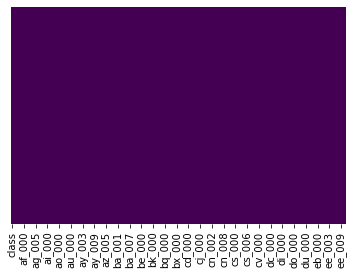

In [9]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [10]:
df[df=="na"].index

RangeIndex(start=0, stop=76000, step=1)

In [11]:
df.replace("na", np.nan, inplace=True)

<AxesSubplot:>

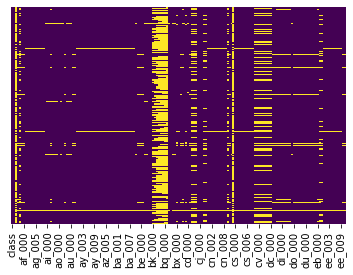

In [12]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [13]:
null_count=list(df.isnull().sum())
col=list(df.columns)
# print(null_count)
# print(col)

In [14]:
d={}
for i in range(len(null_count)):
    d[col[i]]=null_count[i]
# print(d)

In [15]:
d

{'class': 0,
 'aa_000': 0,
 'ab_000': 58692,
 'ac_000': 4261,
 'ad_000': 18842,
 'ae_000': 3190,
 'af_000': 3190,
 'ag_000': 860,
 'ag_001': 860,
 'ag_002': 860,
 'ag_003': 860,
 'ag_004': 860,
 'ag_005': 860,
 'ag_006': 860,
 'ag_007': 860,
 'ag_008': 860,
 'ag_009': 860,
 'ah_000': 820,
 'ai_000': 792,
 'aj_000': 792,
 'ak_000': 5598,
 'al_000': 811,
 'am_0': 792,
 'an_000': 811,
 'ao_000': 751,
 'ap_000': 811,
 'aq_000': 751,
 'ar_000': 3487,
 'as_000': 792,
 'at_000': 792,
 'au_000': 792,
 'av_000': 3188,
 'ax_000': 3189,
 'ay_000': 863,
 'ay_001': 863,
 'ay_002': 863,
 'ay_003': 863,
 'ay_004': 863,
 'ay_005': 863,
 'ay_006': 863,
 'ay_007': 863,
 'ay_008': 863,
 'ay_009': 863,
 'az_000': 863,
 'az_001': 863,
 'az_002': 863,
 'az_003': 863,
 'az_004': 863,
 'az_005': 863,
 'az_006': 863,
 'az_007': 863,
 'az_008': 863,
 'az_009': 863,
 'ba_000': 881,
 'ba_001': 881,
 'ba_002': 881,
 'ba_003': 881,
 'ba_004': 881,
 'ba_005': 881,
 'ba_006': 881,
 'ba_007': 881,
 'ba_008': 881,
 'ba

In [16]:
### Filling null values in feature with median of that feature

for feature in [feature for feature in df.columns if feature not in ['class']]:
    df[feature]=df[feature].fillna(df[feature].median())

<AxesSubplot:>

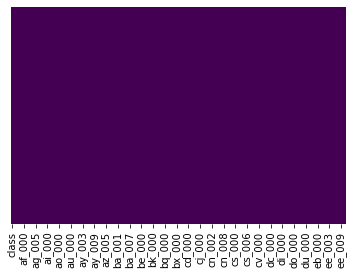

In [17]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [18]:
df

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,0.0,2130706438,280,0,0,0,0,0,0,37250,1432864,3664156,1007684,25896,0,2551696,0,0,0,0,0,4933296,3655166,1766008,1132040,0,0,0,0,1012,268,0,0,0,0,0,469014,4239660,703300,755876,0,5374,2108,4114,12348,615248,5526276,2378,4,0,0,2328746,1022304,415432,287230,310246,681504,1118814,3574,0,0,6700214,0,10,108,50,2551696,97518,947550,799478,330760,353400,299160,305200,283680,287520.0,303960.0,318120.0,178540,76698.08,6700214,6700214,6599892,43566,68656,54064,638360,6167850,1209600,246244,2,96,0,5245752,0,916567.68,6,1924,0,0,0,118196,1309472,3247182,1381362,98822,11208,1608,220,240,6700214,0.0,10476,1226,267998,521832,428776,4015854,895240,26330,118,0,532,734,4122704,51288,0,532572,0,18,5330690,4732,1126,0,0,0,0,0,0,0,0,62282,85908,32790,0,0,202710,37928,14745580,1876644,0,0,0,0,2801180,2445.8,2712,965866,1706908,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,0.0,0,128.0,0,0,0,0,0,0,18254,653294,1720800,516724,31642,0,1393352,0,68,0,0,0,2560898,2127150,1084598,338544,0,0,0,0,0,0,0,0,0,0,0,71510,772720,1996924,99560,0,7336,7808,13776,13086,1010074,1873902,14726,6,0,0,1378576,447166,199512,154298,137280,138668,165908,229652,87082,4708,3646660,86,454,364,350,1393352,49028,688314,392208,341420,359780,366560,251400.0,270300.0,287520.0,303960.0,318120.0,6700,33057.51,3646660,3646660,3582034,17733.0,260120,115626,6900,2942850,1209600,0,2.0,46.0,0.0,2291079.36,0,643536.96,0,0,0,0,38,98644,1179502,1286736,336388,36294,5192,56,8.0,0,3646660,0.0,6160,796,164860,350066,272956,1837600,301242,9148,22,0,212.0,280.0,1186436.0,44669.0,0.0,204.0,0.0,0.0,1743089.0,3312,522,0,0,0,0,0,0,0,0,33736,36946,5936,0,0,103330,16254,4510080,868538,0,0,0,0,3477820,2211.76,2334,664504,824154,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,0.0,228,100,0,0,0,0,0,0,1648,370592,1883374,292936,12016,0,1234132,0,0,0,0,0,2371990,2173634,300796,153698,0,0,0,0,358,110,0,0,0,0,0,0,870456,239798,1450312,0,1620,1156,1228,34250,1811606,710672,34,0,0,0,790690,672026,332340,254892,189596,135758,103552,81666,46,0,2673338,128,202,576,4,1234132,28804,160176,139730,137160,130640,239120.0,251400.0,270300.0,287520.0,303960.0,318120.0,28000,41040.08,2673338,2673338,2678534,15439.0,7466,22436,248240,2560566,1209600,63328,0,124,0,2322692.16,0,236099.52,0,0,0,0,0,33276,1215280,1102798,196502,10260,2422,28,0,6,2673338,0.0,3584,500,56362,149726,100326,1744838,488302,16682,246,0,230,292,2180528,29188,22,20346,0,0,2341048,1494,152,0,0,0,0,0,0,0,0,13876,38182,8138,0,0,65772,10534,300240,48028,0,0,0,0,1040120,1018.64,1020,262032,453378,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,318,2212,3232,1872,0,0,0,2668,0,0,0,642,3894,10184,7554,10764,1014,0,0,0,0,60,6,0,0,0,0,0,0,0,2038,5596,0,64,6,6,914,76,2478,2398,1692,0,0,6176,340,304,102,74,40

In [19]:
### checking duplicates in dataset
df.duplicated().sum()

0

In [20]:
### Checking Datatype of features
df.dtypes

class     object
aa_000     int64
ab_000    object
ac_000    object
ad_000    object
           ...  
ee_007    object
ee_008    object
ee_009    object
ef_000    object
eg_000    object
Length: 171, dtype: object

In [21]:
### Converting datatype of numerical features to int or float from object
for feature in [feature for feature in df.columns if feature not in ['class', 'aa_000']]:
  try:
    df[feature]=df[feature].astype('int64')
  except:
    df[feature]=df[feature].astype('float64')

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Columns: 171 entries, class to eg_000
dtypes: float64(6), int64(164), object(1)
memory usage: 99.2+ MB


In [23]:
### statistical analysis
df.describe().T

,count,mean,std,min,25%,50%,75%,max
aa_000,76000.0,6.115976e+04,2.647366e+05,0.0,860.0,30813.0,48840.0,4.294967e+07
ab_000,76000.0,1.652368e-01,1.609493e+00,0.0,0.0,0.0,0.0,2.040000e+02
ac_000,76000.0,3.364557e+08,7.769769e+08,0.0,20.0,154.0,848.0,2.130707e+09
ad_000,76000.0,1.133174e+05,3.113852e+07,0.0,42.0,128.0,292.0,8.584298e+09
ae_000,76000.0,6.454184e+00,1.501976e+02,0.0,0.0,0.0,0.0,2.105000e+04
...,...,...,...,...,...,...,...,...
ee_007,76000.0,3.440830e+05,1.698180e+06,0.0,122.0,41260.0,166632.0,1.195801e+08
ee_008,76000.0,1.383521e+05,4.667835e+05,0.0,0.0,3862.0,136421.5,1.926740e+07
ee_009,76000.0,8.329316e+03,4.848501e+04,0.0,0.0,0.0,1908.0,4.570398e+06
ef_000,76000.0,8.128947e-02,4.082657e+00,0.0,0.0,0.0,0.0,4.820000e+02


In [24]:
### Getting list of Numerical features
numerical_features=[feature for feature in df.columns if df[feature].dtypes!='O']
print(len(numerical_features))

170


In [25]:
### Getting list of Discrete Numerical features

discreate_features=[feature for feature in numerical_features if df[feature].nunique()<35]
print(discreate_features)

['ab_000', 'as_000', 'cd_000', 'ch_000', 'ef_000']


In [26]:
### Getting list of Continuous Numerical features

continuous_features=[feature for feature in numerical_features if feature not in discreate_features]
print(continuous_features)


['aa_000', 'ac_000', 'ad_000', 'ae_000', 'af_000', 'ag_000', 'ag_001', 'ag_002', 'ag_003', 'ag_004', 'ag_005', 'ag_006', 'ag_007', 'ag_008', 'ag_009', 'ah_000', 'ai_000', 'aj_000', 'ak_000', 'al_000', 'am_0', 'an_000', 'ao_000', 'ap_000', 'aq_000', 'ar_000', 'at_000', 'au_000', 'av_000', 'ax_000', 'ay_000', 'ay_001', 'ay_002', 'ay_003', 'ay_004', 'ay_005', 'ay_006', 'ay_007', 'ay_008', 'ay_009', 'az_000', 'az_001', 'az_002', 'az_003', 'az_004', 'az_005', 'az_006', 'az_007', 'az_008', 'az_009', 'ba_000', 'ba_001', 'ba_002', 'ba_003', 'ba_004', 'ba_005', 'ba_006', 'ba_007', 'ba_008', 'ba_009', 'bb_000', 'bc_000', 'bd_000', 'be_000', 'bf_000', 'bg_000', 'bh_000', 'bi_000', 'bj_000', 'bk_000', 'bl_000', 'bm_000', 'bn_000', 'bo_000', 'bp_000', 'bq_000', 'br_000', 'bs_000', 'bt_000', 'bu_000', 'bv_000', 'bx_000', 'by_000', 'bz_000', 'ca_000', 'cb_000', 'cc_000', 'ce_000', 'cf_000', 'cg_000', 'ci_000', 'cj_000', 'ck_000', 'cl_000', 'cm_000', 'cn_000', 'cn_001', 'cn_002', 'cn_003', 'cn_004', '

### Distribution of Continuous Features

In [27]:
### For Q-Q Plot
import scipy.stats as stats

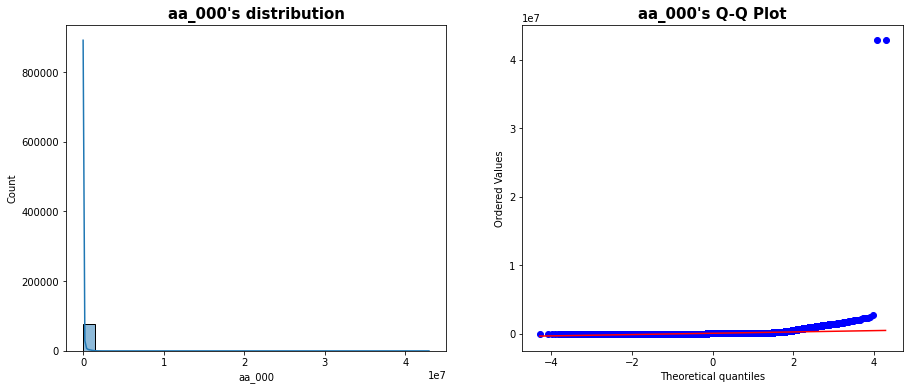

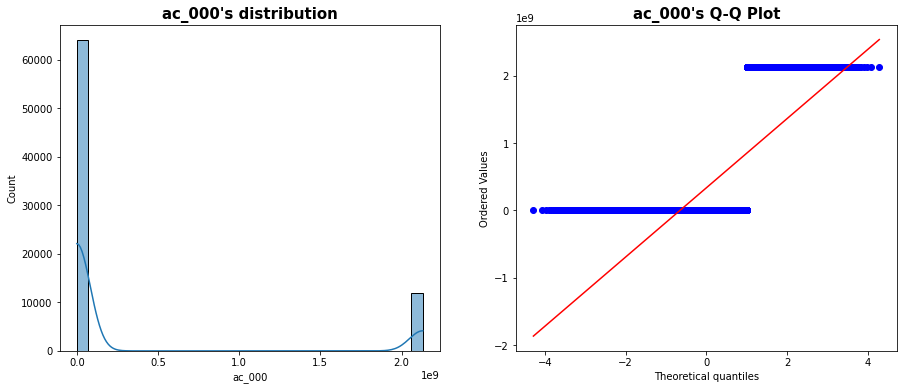

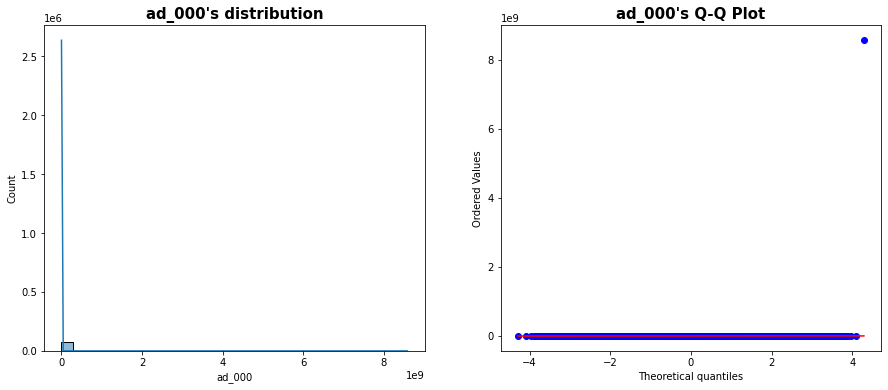

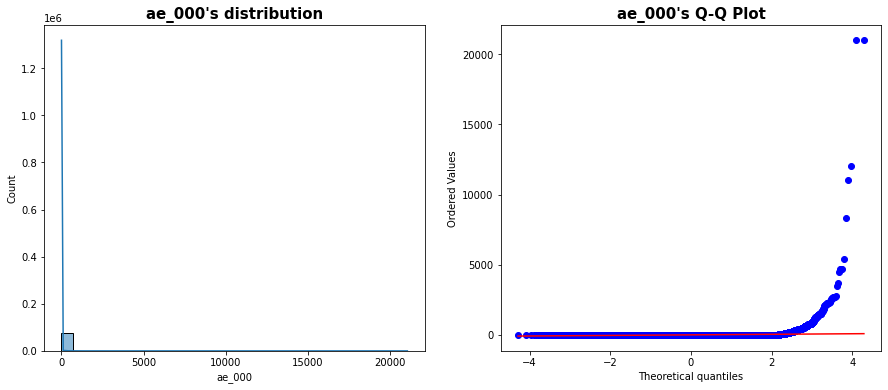

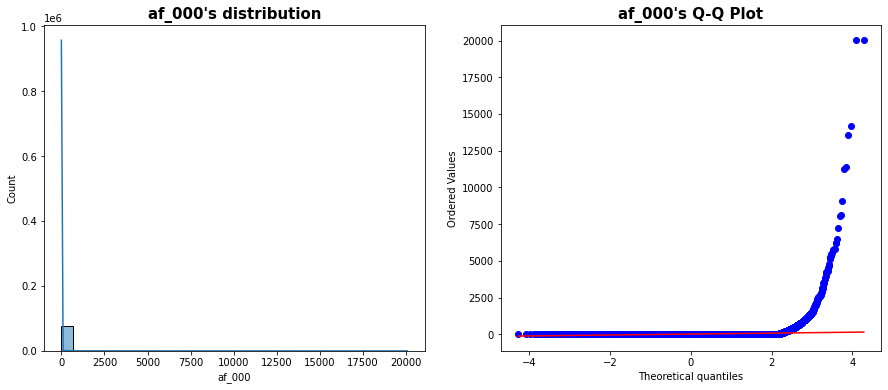

...

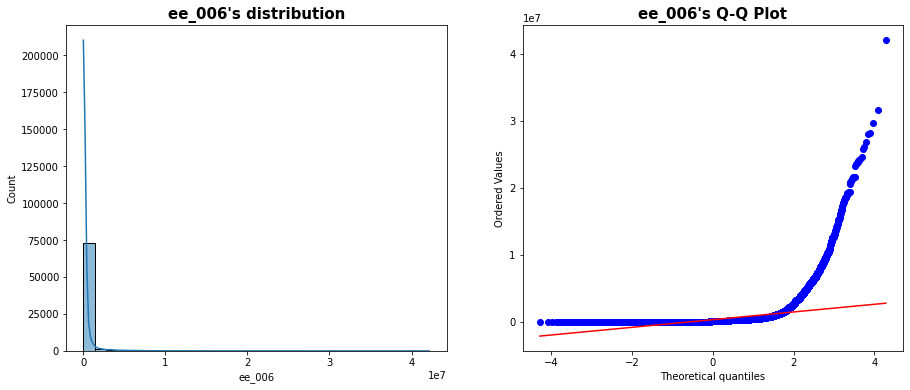

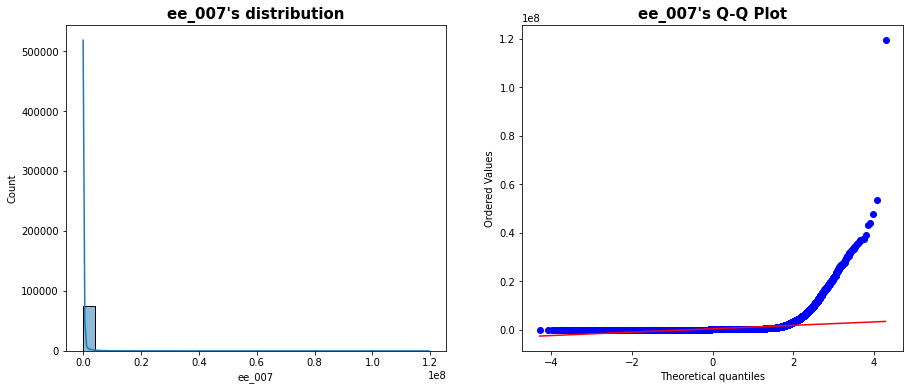

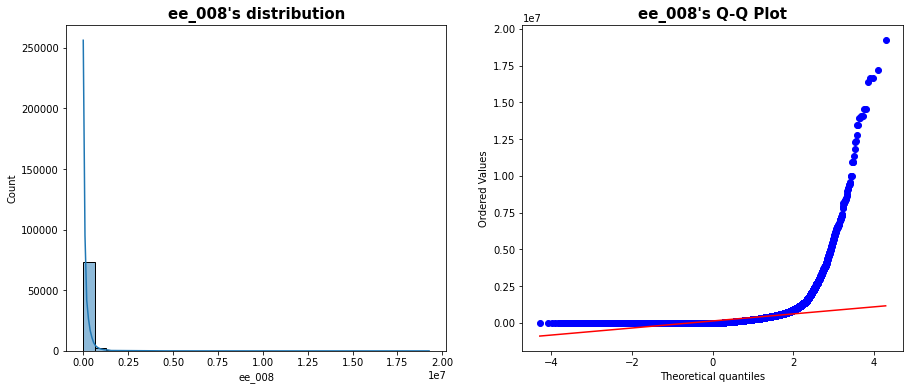

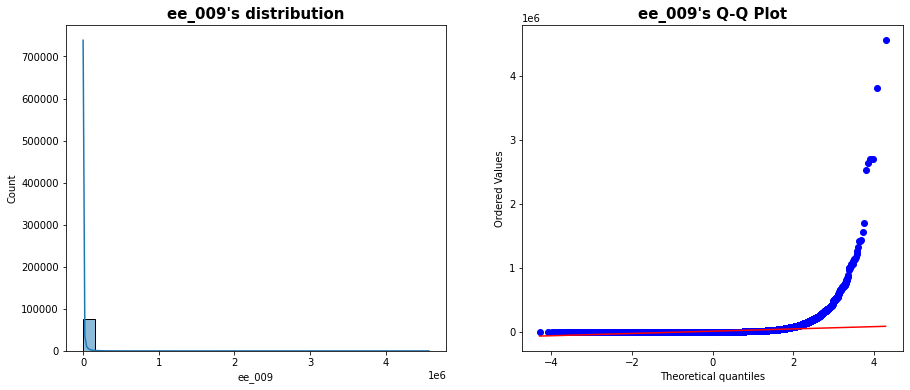

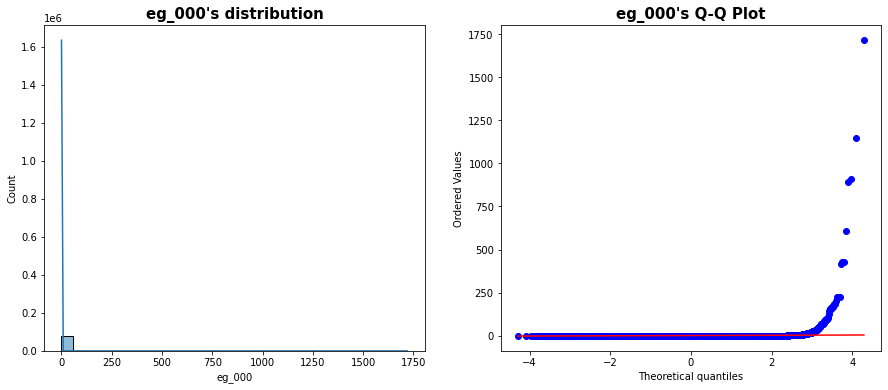

In [28]:
### Checking distribution of Continuous numerical features

for feature in continuous_features:
    plt.figure(figsize=(15,6))
    plt.subplot(121)
    sns.histplot(data=df, x=feature, kde=True, bins=30)
    plt.title("{}'s distribution".format(feature),fontweight="bold", fontsize=15)
    
    plt.subplot(122)
    stats.probplot(df[feature], dist='norm', plot=plt)
    plt.title("{}'s Q-Q Plot".format(feature),fontweight="bold", fontsize=15)
    plt.show();

### Outliers in Numerical Features

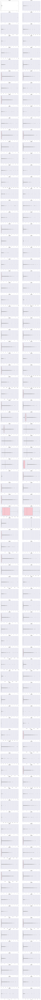

In [29]:
### Checking outliers in numerical features

plt.figure(figsize=(20,510))
for feature in enumerate(numerical_features):
    plt.subplot(85, 2, feature[0]+1)
    sns.set(rc={'figure.figsize':(10,6)})
    sns.boxplot(data=df, x=feature[1], color='pink')
    plt.title("{}".format(feature[1]), fontweight="bold", fontsize=15)

### Handling Outliers in Continuous Features

In [30]:
### Function to Cap Outlier
def remove_outliers(in_data, in_col):
    # Finding the IQR
    first_quartile = in_data[in_col].quantile(0.25)
    third_quartile = in_data[in_col].quantile(0.75)
    iqr = third_quartile - first_quartile
    upper_limit = third_quartile + 1.5 * iqr
    lower_limit = first_quartile - 1.5 * iqr
    in_data.loc[(in_data[in_col]>upper_limit), in_col]= upper_limit
    in_data.loc[(in_data[in_col]<lower_limit), in_col]= lower_limit    
    return in_data

In [31]:
### Capping outliers from continuous features
for feature in continuous_features:
    df=remove_outliers(df, feature)

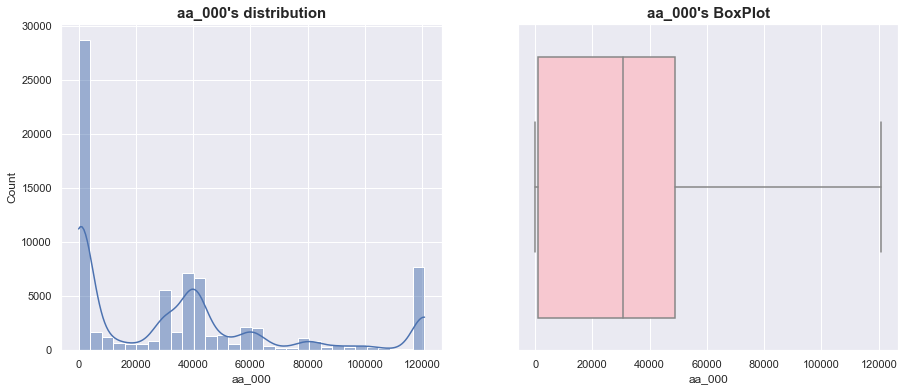

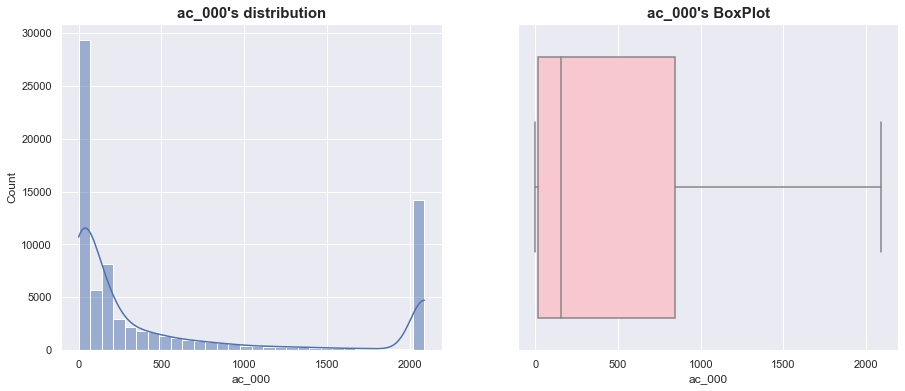

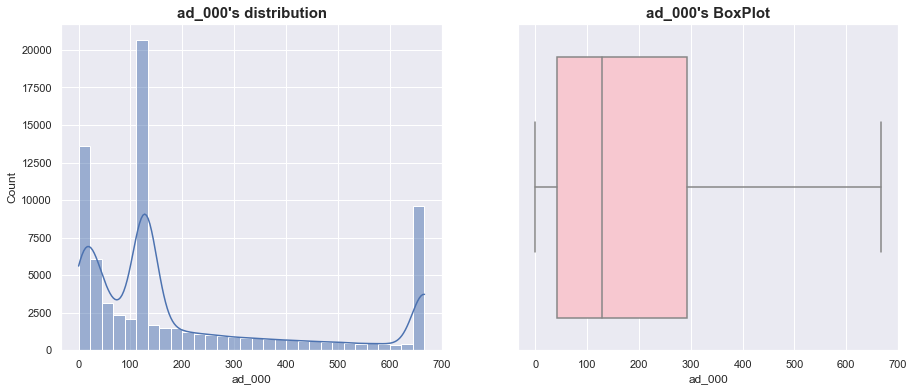

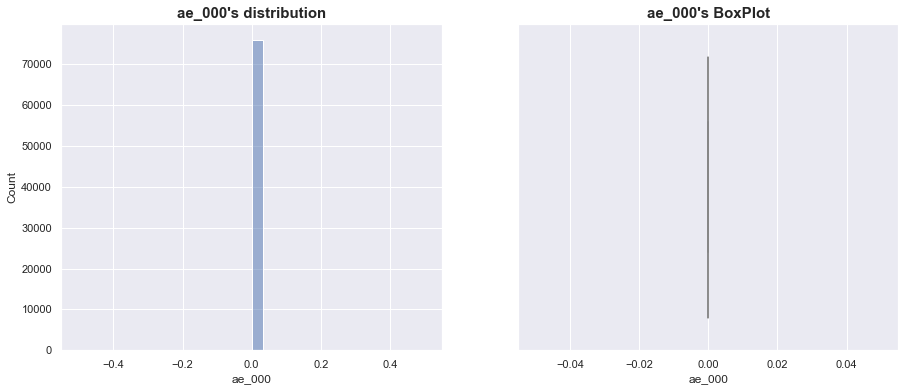

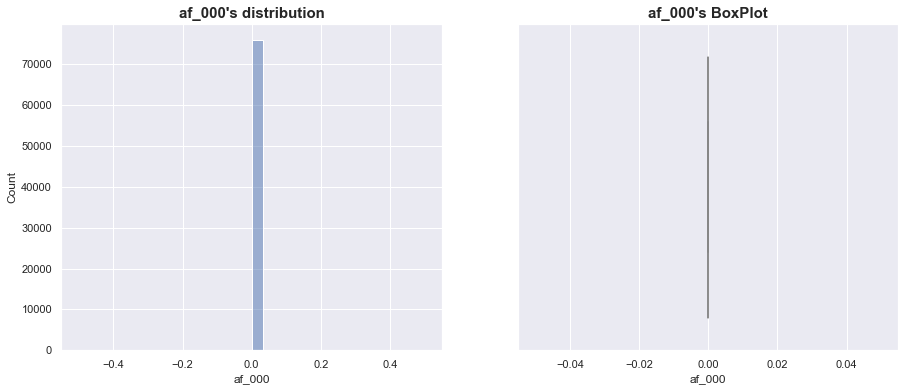

...

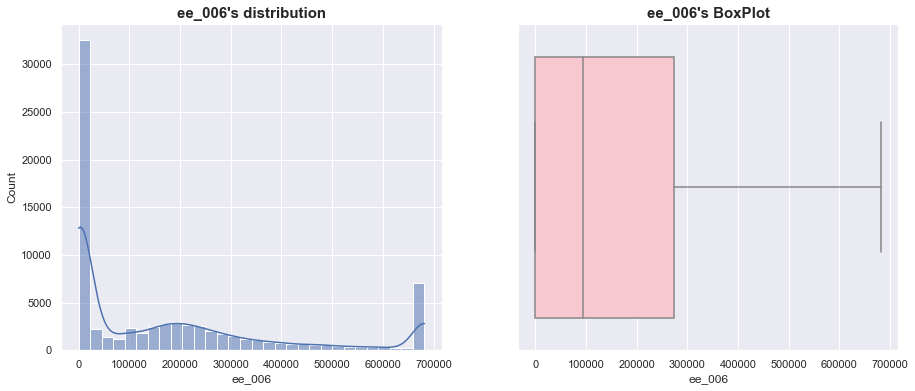

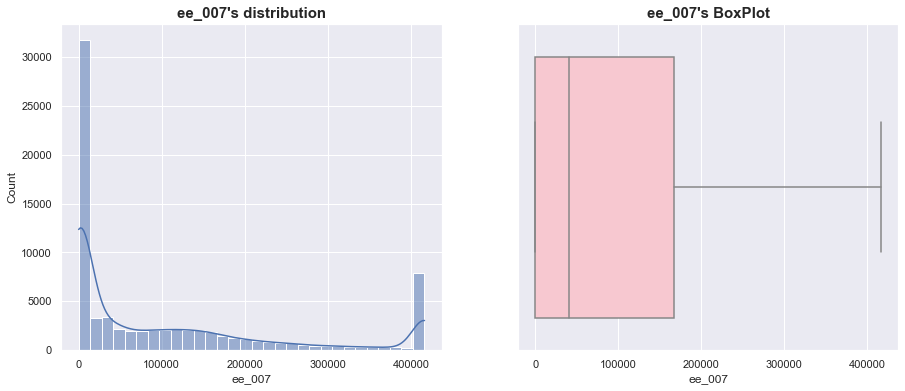

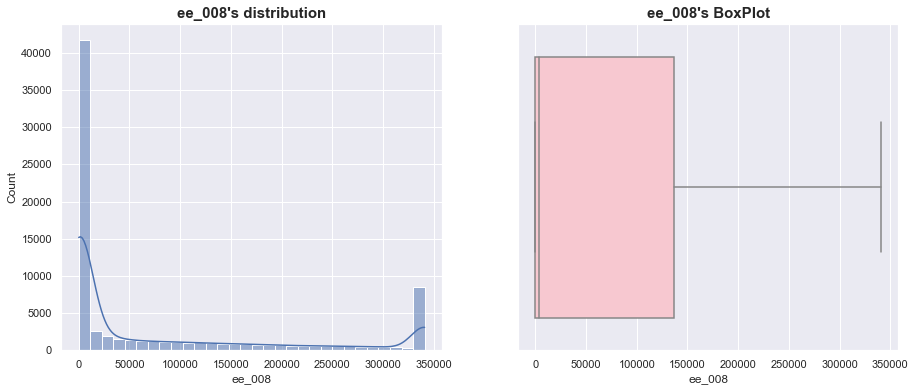

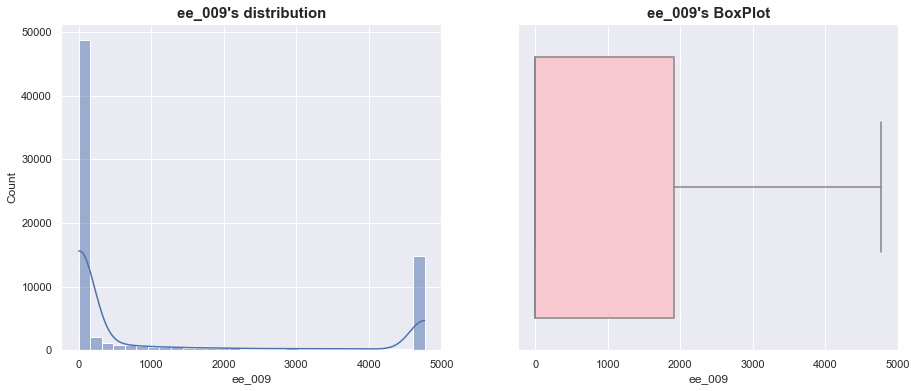

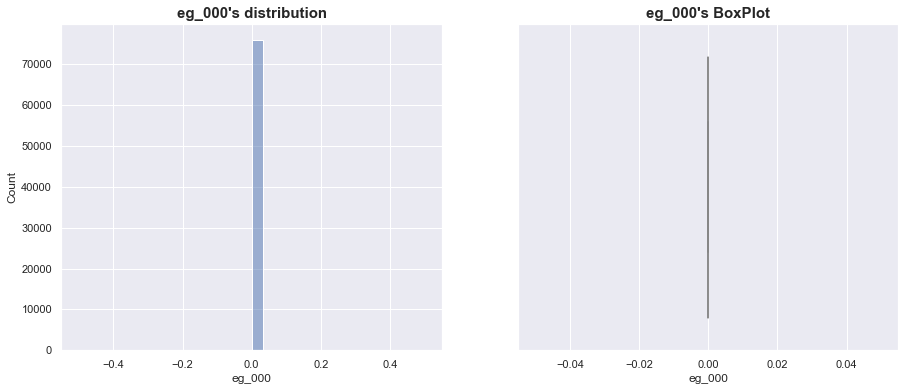

In [32]:
### Checking distribution and Boxplot of continuous features after outlier capping

for feature in continuous_features:
    plt.figure(figsize=(15,6))
    plt.subplot(121)
    sns.histplot(data=df, x=feature, kde=True, bins=30)
    plt.title("{}'s distribution".format(feature),fontweight="bold", fontsize=15)
    
    plt.subplot(122)
    sns.boxplot(data=df, x=feature, color='pink')
    plt.title("{}'s BoxPlot".format(feature),fontweight="bold", fontsize=15)
    plt.show();

**Observations**

* As per the above plot most of the features are not normally distributed.
* Transformation of data is not of prime importance since it is a classification problem.
* Interpreting each and every column is not necessary as this is sensor data.

Positive: 1375, Negative: 74625


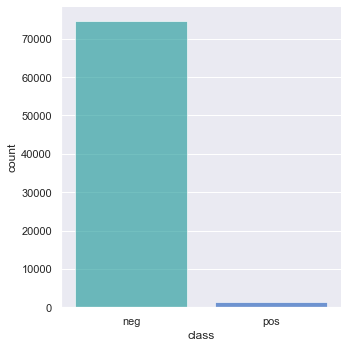

In [33]:
pos = df[df['class']=='pos'].shape[0]
neg = df[df['class']=='neg'].shape[0]
print("Positive: " + str(pos) + ", Negative: " + str(neg))
sns.catplot(data=df, x="class", kind="count", palette="winter_r", alpha=.6)
plt.show()

**Observation**
* The target classes are highly imbalanced
* Class imbalance is a scenario that arises when we have unequal distribution of class in a dataset i.e. the no. of data points in the negative class (majority class) very large compared to that of the positive class (minority class)
* If the imbalanced data is not treated beforehand, then this will degrade the performance of the classifier model.
* Hence we should handle imbalanced data with certain methods.

### Correlation and Heatmap

In [34]:
### Getting correlation between independent features
corr=round(df.corr(),2)
corr

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
aa_000,1.00,-0.02,0.20,0.41,NaN,NaN,NaN,NaN,NaN,NaN,0.51,0.79,0.84,0.67,0.54,0.37,0.96,NaN,NaN,NaN,0.24,0.23,0.96,0.96,0.89,0.89,NaN,0.02,NaN,NaN,0.40,0.41,NaN,NaN,NaN,NaN,NaN,0.43,0.60,0.79,0.63,NaN,0.70,0.65,0.66,0.49,0.67,0.78,0.12,NaN,NaN,NaN,0.86,0.91,0.92,0.92,0.91,0.86,0.80,0.64,0.47,0.17,0.95,0.43,0.43,0.52,0.43,0.96,0.92,0.88,0.86,0.03,-0.05,NaN,NaN,NaN,NaN,NaN,NaN,0.40,1.00,0.95,0.95,0.88,0.93,0.39,0.39,0.45,0.88,NaN,0.57,0.09,0.53,0.00,0.98,NaN,0.86,NaN,0.12,NaN,NaN,0.30,0.67,0.88,0.83,0.67,0.70,0.72,0.55,0.33,0.33,0.95,NaN,0.79,0.85,0.73,0.78,0.80,0.91,0.72,0.61,0.20,NaN,0.42,0.43,0.71,0.44,NaN,0.35,NaN,0.06,0.75,0.75,0.53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.90,0.72,0.71,NaN,NaN,0.80,0.79,0.45,0.49,0.01,0.02,NaN,NaN,0.47,0.66,0.70,0.80,0.84,0.88,0.88,0.86,0.85,0.83,0.76,0.54,0.37,-0.00,NaN
ab_000,-0.02,1.00,0.00,-0.04,NaN,NaN,NaN,NaN,NaN,NaN,0.05,0.00,-0.04,-0.05,-0.03,-0.02,-0.01,NaN,NaN,NaN,0.10,0.10,-0.01,-0.01,-0.00,-0.01,NaN,-0.00,NaN,NaN,-0.01,0.00,NaN,NaN,NaN,NaN,NaN,-0.06,-0.07,-0.02,0.01,NaN,0.02,0.00,-0.00,-0.04,-0.06,-0.01,0.13,NaN,NaN,NaN,-0.01,-0.02,-0.02,-0.03,-0.03,-0.03,-0.04,-0.03,0.03,0.12,-0.01,0.01,-0.01,-0.00,-0.04,-0.01,-0.01,0.00,-0.00,0.02,0.01,NaN,NaN,NaN,NaN,NaN,NaN,0.01,-0.02,-0.01,-0.01,-0.01,-0.02,-0.04,-0.02,-0.02,-0.01,NaN,-0.02,0.01,-0.02,0.00,-0.01,NaN,0.00,NaN,0.12,NaN,NaN,0.09,0.01,-0.02,-0.03,-0.01,0.00,0.00,0.00,-0.02,0.01,-0.01,NaN,0.01,-0.01,0.00,-0.01,-0.01,-0.02,-0.03,-0.02,-0.02,NaN,-0.04,-0.03,-0.02,-0.01,NaN,-0.03,NaN,-0.06,-0.02,-0.00,0.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.01,-0.04,-0.04,NaN,NaN,-0.02,-0.01,-0.03,-0.03,0.05,0.05,NaN,NaN,-0.01,-0.01,0.01,-0.00,-0.02,-0.03,-0.03,-0.03,-0.03,-0.02,-0.02,-0.06,-0.06,0.05,NaN
ac_000,0.20,0.00,1.00,0.50,NaN,NaN,NaN,NaN,NaN,NaN,0.05,0.16,0.21,0.23,0.26,0.22,0.21,NaN,NaN,NaN,-0.06,-0.06,0.22,0.21,0.22,0.26,NaN,-0.00,NaN,NaN,0.48,0.47,NaN,NaN,NaN,NaN,NaN,0.12,0.18,0.18,0.15,NaN,0.06,0.08,0.09,0.12,0.09,0.24,0.06,NaN,NaN,NaN,0.20,0.24,0.21,0.21,0.21,0.18,0.19,0.17,0.06,-0.02,0.22,0.17,0.20,0.20,0.14,0.21,0.22,0.20,0.23,-0.01,-0.05,NaN,NaN,NaN,NaN,NaN,NaN,0.14,0.20,0.22,0.22,0.26,0.22,0.03,0.20,0.17,0.26,NaN,0.46,0.21,0.29,-0.00,0.22,NaN,0.23,NaN,0.29,NaN,NaN,-0.03,0.08,0.16,0.23,0.27,0.26,0.25,0.26,0.28,0.29,0.22,NaN,0.20,0.21,0.18,0.24,0.16,0.21,0.24,0.24,0.23,NaN,0.48,0.38,0.32,0.25,NaN,0.28,NaN,0.30,0.31,0.30,0.30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.25,0.26,0.38,NaN,NaN,0.25,0.28,0.39,0.35,0.15,0.14,NaN,NaN,0.17,0.23,0.28,0.23,0.24,0.22,0.20,0.18,0.16,0.16,0.16,0.16,0.14,0.02,NaN
ad_000,0.41,-0.04,0.50,1.00,NaN,NaN,NaN,NaN,NaN,NaN,0.14,0.31,0.43,0.44,0.48,0.44,0.43,NaN,NaN,NaN,-0.05,-0.06,0.43,0.41,0.42,0.47,NaN,-0.00,NaN,NaN,0.77,0.70,NaN,NaN,NaN,NaN,NaN,0.31,0.40,0.39,0.27,NaN,0.28,0.27,0.28,0.45,0.40,0.31,-0.01,NaN,NaN,NaN,0.42,0.44,0.41,0.41,0.41,0.38,0.39,0.38,

<AxesSubplot:>

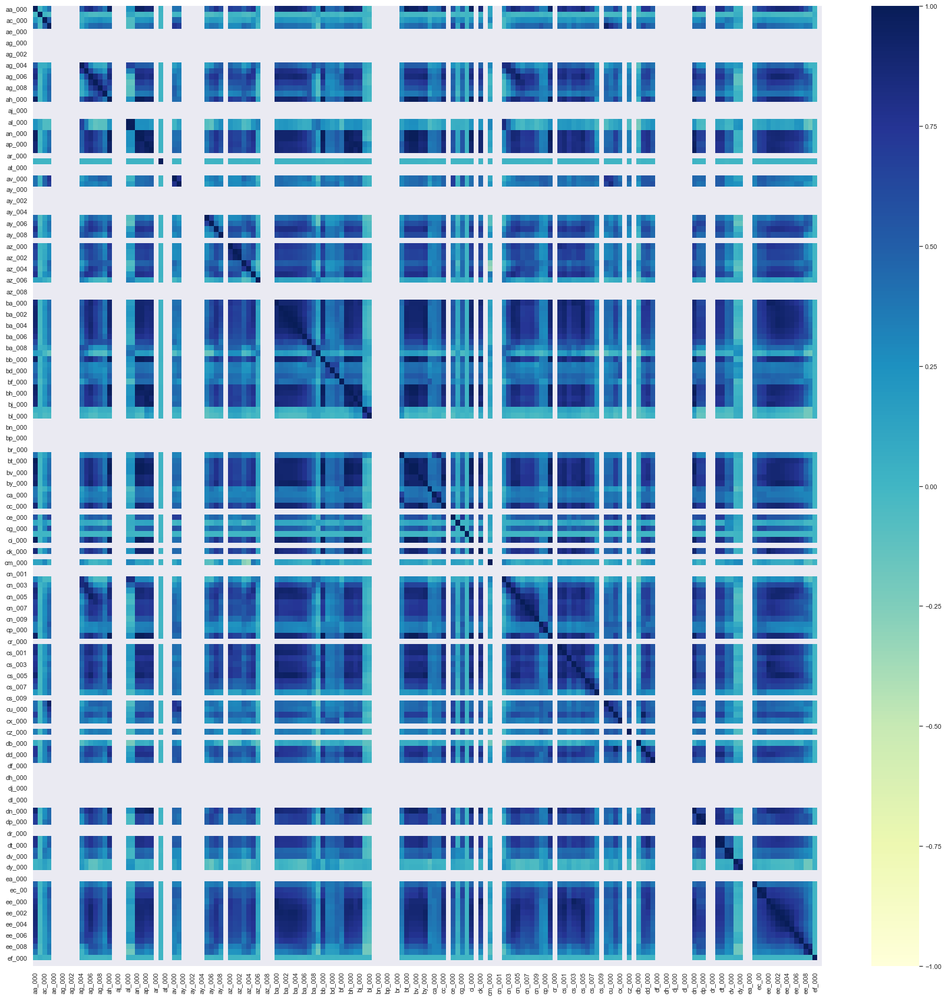

In [35]:
### Plotting heatmap for visualising the correlation between features
sns.set(rc={'figure.figsize':(30,30)})
sns.heatmap(data=corr, annot=False,  vmin=-1, vmax=1, cmap="YlGnBu")

### Scaling and Principal Component Analysis

In [36]:
### Creating copy of dataset
data=df.copy()
data.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,0,2090,280,0,0,0,0,0,0,37250.0,1432864,3664156,1007684,25896.0,0,2551696.0,0,0,0,0.0,0,4933296.0,3655166,1761143.75,928936.75,0,0,0,0,1012,268,0,0,0,0,0,97260,3138513.75,703300.0,755876.0,0,5374.0,2108,4114,12348,615248.0,4356941.75,2378,0,0,0,2328746.0,1022304.0,415432.0,287230.0,310246.0,457187,508609,3574,0.00,0,6700214.0,0,10,108,45,2551696,97518.0,918110,799478.0,293040,261180,239120,251400,270300,287520,303960,318120,178540,76698.08,6700214.0,6700214.0,6599892.0,43566.0,30116,54064.0,638360,6167850,1209600,211863,2,96,0,5245752.00,0.0,916567.68,0,135,0,0,0.0,118196.0,1309472.0,3247182.0,1108441.75,76591.75,11208,720,77,171,6700214.0,0,10476.0,1226,233495,521832.0,428776,4015854.0,895240,26330,118,0,532,734,4122704.0,51288,0,5933,0,18,5330690.0,4732,610,0,0,0,0,0,0,0,0,62282.0,85908,20108,0,0,202710,37928.0,7798522.5,1227022,0,0,0,0,2801180.00,2445.80,2712,965866.0,1636220.25,1083002,493384,721044.0,469792,339156.0,157956,73224.00,0,0,0
1,neg,33058,0,0,128,0,0,0,0,0,0,18254.0,653294,1720800,516724,31642.0,0,1393352.0,0,0,0,0.0,0,2560898.0,2127150,1084598.00,338544.00,0,0,0,0,0,0,0,0,0,0,0,71510,772720.00,1996924.0,99560.0,0,7336.0,4902,7604,13086,1010074.0,1873902.00,10370,0,0,0,1378576.0,447166.0,199512.0,154298.0,137280.0,138668,165908,229652,4306.25,140,3646660.0,86,454,364,45,1393352,49028.0,688314,392208.0,293040,261180,239120,251400,270300,287520,303960,318120,6700,33057.51,3646660.0,3646660.0,3582034.0,17733.0,30116,115626.0,6900,2942850,1209600,0,2,46,0,2291079.36,0.0,643536.96,0,0,0,0,38.0,98644.0,1179502.0,1286736.0,336388.00,36294.00,5192,56,8,0,3646660.0,0,6160.0,796,164860,350066.0,272956,1837600.0,301242,9148,22,0,212,280,1186436.0,44669,0,204,0,0,1743089.0,3312,522,0,0,0,0,0,0,0,0,33736.0,36946,5936,0,0,103330,16254.0,4510080.0,868538,0,0,0,0,3477820.00,2211.76,2334,664504.0,824154.00,421400,178064,293306.0,245416,133654.0,81140,97576.00,1500,0,0
2,neg,41040,0,228,100,0,0,0,0,0,0,1648.0,370592,1883374,292936,12016.0,0,1234132.0,0,0,0,0.0,0,2371990.0,2173634,300796.00,153698.00,0,0,0,0,358,110,0,0,0,0,0,0,870456.00,239798.0,1450312.0,0,1620.0,1156,1228,34250,1811606.0,710672.00,34,0,0,0,790690.0,672026.0,332340.0,254892.0,189596.0,135758,103552,81666,46.00,0,2673338.0,128,202,576,4,1234132,28804.0,160176,139730.0,137160,185340,239120,251400,270300,287520,303960,318120,28000,41040.08,2673338.0,2673338.0,2678534.0,15439.0,7466,22436.0,248240,2560566,1209600,63328,0,124,0,2322692.16,0.0,236099.52,0,0,0,0,0.0,33276.0,1215280.0,1102798.0,196502.00,10260.00,2422,28,0,6,2673338.0,0,3584.0,500,56362,149726.0,100326,1744838.0,488302,16682,246,0,230,292,2180528.0,29188,0,5933,0,0,2341048.0,1494,152,0,0,0,0,0,0,0,0,13876.0,38182,8138,0,0,65772,10534.0,300240.0,48028,0,0,0,0,1040120.00,1018.64,1020,262032.0,453378.00,277378,159812,423992

In [37]:
### Getting independent features in a dataframe
X=data.drop('class', axis=1)
X.head()

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698,0,2090,280,0,0,0,0,0,0,37250.0,1432864,3664156,1007684,25896.0,0,2551696.0,0,0,0,0.0,0,4933296.0,3655166,1761143.75,928936.75,0,0,0,0,1012,268,0,0,0,0,0,97260,3138513.75,703300.0,755876.0,0,5374.0,2108,4114,12348,615248.0,4356941.75,2378,0,0,0,2328746.0,1022304.0,415432.0,287230.0,310246.0,457187,508609,3574,0.00,0,6700214.0,0,10,108,45,2551696,97518.0,918110,799478.0,293040,261180,239120,251400,270300,287520,303960,318120,178540,76698.08,6700214.0,6700214.0,6599892.0,43566.0,30116,54064.0,638360,6167850,1209600,211863,2,96,0,5245752.00,0.0,916567.68,0,135,0,0,0.0,118196.0,1309472.0,3247182.0,1108441.75,76591.75,11208,720,77,171,6700214.0,0,10476.0,1226,233495,521832.0,428776,4015854.0,895240,26330,118,0,532,734,4122704.0,51288,0,5933,0,18,5330690.0,4732,610,0,0,0,0,0,0,0,0,62282.0,85908,20108,0,0,202710,37928.0,7798522.5,1227022,0,0,0,0,2801180.00,2445.80,2712,965866.0,1636220.25,1083002,493384,721044.0,469792,339156.0,157956,73224.00,0,0,0
1,33058,0,0,128,0,0,0,0,0,0,18254.0,653294,1720800,516724,31642.0,0,1393352.0,0,0,0,0.0,0,2560898.0,2127150,1084598.00,338544.00,0,0,0,0,0,0,0,0,0,0,0,71510,772720.00,1996924.0,99560.0,0,7336.0,4902,7604,13086,1010074.0,1873902.00,10370,0,0,0,1378576.0,447166.0,199512.0,154298.0,137280.0,138668,165908,229652,4306.25,140,3646660.0,86,454,364,45,1393352,49028.0,688314,392208.0,293040,261180,239120,251400,270300,287520,303960,318120,6700,33057.51,3646660.0,3646660.0,3582034.0,17733.0,30116,115626.0,6900,2942850,1209600,0,2,46,0,2291079.36,0.0,643536.96,0,0,0,0,38.0,98644.0,1179502.0,1286736.0,336388.00,36294.00,5192,56,8,0,3646660.0,0,6160.0,796,164860,350066.0,272956,1837600.0,301242,9148,22,0,212,280,1186436.0,44669,0,204,0,0,1743089.0,3312,522,0,0,0,0,0,0,0,0,33736.0,36946,5936,0,0,103330,16254.0,4510080.0,868538,0,0,0,0,3477820.00,2211.76,2334,664504.0,824154.00,421400,178064,293306.0,245416,133654.0,81140,97576.00,1500,0,0
2,41040,0,228,100,0,0,0,0,0,0,1648.0,370592,1883374,292936,12016.0,0,1234132.0,0,0,0,0.0,0,2371990.0,2173634,300796.00,153698.00,0,0,0,0,358,110,0,0,0,0,0,0,870456.00,239798.0,1450312.0,0,1620.0,1156,1228,34250,1811606.0,710672.00,34,0,0,0,790690.0,672026.0,332340.0,254892.0,189596.0,135758,103552,81666,46.00,0,2673338.0,128,202,576,4,1234132,28804.0,160176,139730.0,137160,185340,239120,251400,270300,287520,303960,318120,28000,41040.08,2673338.0,2673338.0,2678534.0,15439.0,7466,22436.0,248240,2560566,1209600,63328,0,124,0,2322692.16,0.0,236099.52,0,0,0,0,0.0,33276.0,1215280.0,1102798.0,196502.00,10260.00,2422,28,0,6,2673338.0,0,3584.0,500,56362,149726.0,100326,1744838.0,488302,16682,246,0,230,292,2180528.0,29188,0,5933,0,0,2341048.0,1494,152,0,0,0,0,0,0,0,0,13876.0,38182,8138,0,0,65772,10534.0,300240.0,48028,0,0,0,0,1040120.00,1018.64,1020,262032.0,453378.00,277378,159812,423992.0,409564,320746.0

In [38]:
### seperating target feature
y=data['class']
y.unique()

array(['neg', 'pos'], dtype=object)

+ **Manually Encoding Target Variable**

In [39]:
### encoding target feature
y=y.replace({'neg':0, 'pos':1})

In [40]:
y.unique()

array([0, 1], dtype=int64)

In [41]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test =  train_test_split(X, y, test_size=0.3, random_state=32)

In [42]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

* **Handling Imbalanced data**

In [43]:
from imblearn.combine import SMOTETomek

# Resampling the minority class. The strategy can be changed as required.
smt = SMOTETomek(random_state=42,sampling_strategy='minority',n_jobs=-1)
# Fit the model to generate the data.
X_res, y_res = smt.fit_resample(X_train, y_train)

* **Initialize Default Models in a dictionary**

In [44]:
#_Dictionary_which_contains_models_for_experiment
Logistic_Regression = LogisticRegression()
Support_Vector_Classifier = SVC()
Decision_Tree_Classifier = DecisionTreeClassifier()
Random_Forest_Classifier = RandomForestClassifier()
Bagging_Classifier = BaggingClassifier(base_estimator=LogisticRegression())
Extra_Tree_Classifier = ExtraTreesClassifier()
AdaBoost_Classifier = AdaBoostClassifier()
GradientBoost_Classifier = GradientBoostingClassifier()
XGBoost_Classifier = XGBClassifier()

classifiers=[Logistic_Regression, Support_Vector_Classifier, Decision_Tree_Classifier, Random_Forest_Classifier, Bagging_Classifier, Extra_Tree_Classifier, AdaBoost_Classifier, GradientBoost_Classifier, XGBoost_Classifier]

* **Creating model pipline**

In [45]:
# creating a pipeline
from sklearn.pipeline import Pipeline

for c in classifiers:
    pipe = Pipeline(steps = [('classifiers', c)])
    pipe.fit(X_res, y_res)
    y_pred = pipe.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1score = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)
    
    print(f"Algorithm: {c}")
    print(f"Accuracy Score: {accuracy}")
    print(f"Precision Score: {precision}")
    print(f"Recall Score: {recall}")
    print(f"F1-Score: {f1score}")
    print(f"ROC_AUC Score: {roc_auc}")
    print("\n")

Algorithm: LogisticRegression()
Accuracy Score: 0.9570175438596491
Precision Score: 0.27300613496932513
Recall Score: 0.9175257731958762
F1-Score: 0.4208037825059102
ROC_AUC Score: 0.9376135023395051


Algorithm: SVC()
Accuracy Score: 0.9780263157894736
Precision Score: 0.4306748466257669
Recall Score: 0.904639175257732
F1-Score: 0.5835411471321695
ROC_AUC Score: 0.9419679902703081


Algorithm: DecisionTreeClassifier()
Accuracy Score: 0.9823245614035088
Precision Score: 0.48592870544090055
Recall Score: 0.6675257731958762
F1-Score: 0.5624321389793703
ROC_AUC Score: 0.827650089881893


Algorithm: RandomForestClassifier()
Accuracy Score: 0.9884649122807018
Precision Score: 0.6443418013856813
Recall Score: 0.7190721649484536
F1-Score: 0.679658952496955
ROC_AUC Score: 0.8561004230060848


Algorithm: BaggingClassifier(base_estimator=LogisticRegression())
Accuracy Score: 0.9568859649122807
Precision Score: 0.2720306513409962
Recall Score: 0.9149484536082474
F1-Score: 0.41937389249852336
ROC_

**Observation**

From the report we can see that ExtraTreesClassifier has performed the best with acurracy of 0.9903, f1 score of 0.7220 and ROC-AUC score of 0.8671

* **Fitting the Final model and get reports**

In [46]:
ET_params={'n_estimators':[100,200, 300],
           'max_depth': [None, 5,10],
           'min_samples_leaf': [5,10,15]}

model=ExtraTreesClassifier()
grid=GridSearchCV(estimator=model,param_grid=ET_params, cv=2,  verbose=2)
grid.fit(X_res, y_res)

Fitting 2 folds for each of 27 candidates, totalling 54 fits
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=100; total time=  16.3s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=100; total time=  16.0s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=200; total time=  32.8s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=200; total time=  33.0s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=300; total time=  48.2s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=300; total time=  48.9s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=100; total time=  15.7s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=100; total time=  15.4s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=200; total time=  33.6s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=200; total time=  35.5s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=300; total time=  50.9s
[CV] END max_depth=None, min_sam

GridSearchCV(cv=2, estimator=ExtraTreesClassifier(),
             param_grid={'max_depth': [None, 5, 10],
                         'min_samples_leaf': [5, 10, 15],
                         'n_estimators': [100, 200, 300]},
             verbose=2)

In [47]:
# best parameters
grid.best_params_

{'max_depth': None, 'min_samples_leaf': 5, 'n_estimators': 300}

Final prediction

In [49]:
final_model = ExtraTreesClassifier(max_depth=None, min_samples_leaf=5, n_estimators=300)

final_model.fit(X_res, y_res)

final_predi = final_model.predict(X_test)

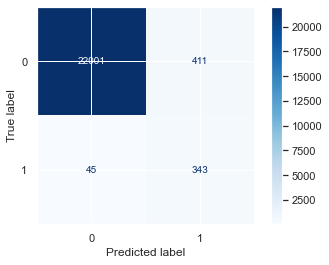

In [65]:
from sklearn.metrics import plot_confusion_matrix

#plots Confusion matrix

# plt.figure(figsize=(5, 5))
plot_confusion_matrix(final_model, X_test, y_test, cmap='Blues', values_format='d')
plt.show()

In [59]:
cm = confusion_matrix(y_test, final_predi)
roc_auc = roc_auc_score(y_test, final_predi)
# report = classification_report(y_test, final_predi)
accuracy = accuracy_score(y_test, final_predi)
precision = precision_score(y_test, final_predi)
recall = recall_score(y_test, final_predi)
f1score = f1_score(y_test, final_predi)

print(f"ConfusionMatrix: {cm}")
print(f"Accuracy Score: {accuracy}")
print(f"Precision Score: {precision}")
print(f"Recall Score: {recall}")
print(f"F1-Score: {f1score}")
print(f"ROC_AUC Score: {roc_auc}")
# print(f"Classification Report: {report}")

ConfusionMatrix: [[22001   411]
 [   45   343]]
Accuracy Score: 0.98
Precision Score: 0.45490716180371354
Recall Score: 0.884020618556701
F1-Score: 0.6007005253940455
ROC_AUC Score: 0.9328411142042831


**After Hyperparameter tunning the accuracy score and f1 score have dropped the roc_auc score has increased telling us that that the crossover has decreased.**